<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Steam%20Top%201495%20Games%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Steam Top 1495 Games Dataset

## Understanding Success: A Deep Dive into Steam's Top Games (300-500 Word Summary)

This analysis delved into a dataset comprising 1495 top games on Steam, aiming to uncover what truly drives a game's success, particularly in terms of player engagement and positive reception. The dataset offers a rich array of information, from basic details like name, price, and release date, to crucial metrics like review scores, estimated owners, playtime, and even developer/publisher information.

Initial Explorations and Data Characteristics:

Our initial data exploration revealed a diverse landscape. While many games share common characteristics, there's significant variability across numerical features. For instance, price_usd ranges widely, and discount_pct shows how frequently games are sold at reduced rates. Review counts (positive_reviews, negative_reviews) and peak_ccu (peak concurrent users) often exhibit skewed distributions, typical of popularity metrics, with a few titles achieving massive success while many others remain niche. The metacritic_score, when available, also provided an external quality benchmark. Categorical data, such as estimated_owners, highlighted the broad spectrum of a game's reach, with most games falling into the '200,000 - 500,000' owner bracket.

Key Statistical Insights into Player Economics:

The Free-to-Play Paradox: A statistical test (Mann-Whitney U) compared the peak concurrent user counts (Peak CCU) between Free-to-Play (F2P) and Paid games. Interestingly, our analysis found no statistically significant difference in median peak player counts based solely on the monetization model. This suggests that simply being free doesn't automatically guarantee higher concurrent players; other factors likely play a more crucial role in attracting and retaining a large player base.

Pricing Elasticity & Sentiment: Examining paid games, we explored the relationship between price_usd and sentiment_ratio (the proportion of positive reviews). A Spearman Rank Correlation revealed a positive correlation. This means that, contrary to a simple expectation of cheaper games getting better reviews, more expensive games tended to receive more positive sentiment. This insight points to a strong likelihood that higher-priced games often correspond to higher-quality, AAA titles that meet or exceed player expectations, or that players are more forgiving of flaws in cheaper games.

Drivers of Success: Multivariate Analysis & Predictive Modeling:

To understand the complex interplay of factors, we employed a multivariate OLS regression. This analysis identified several significant drivers of Log(Peak CCU)—a transformed version of concurrent users to handle its skewed nature. Controlling for other variables, the model showed that metacritic_score, price_usd, total_reviews, and dlc_count all positively influence the Log(Peak CCU). This suggests that a higher critical score, a higher price (again, implying higher production value), more reviews (indicating greater visibility/engagement), and more DLC (implying continued content and support) are all associated with greater player concurrency.

Finally, a predictive model was built to classify games as 'Highly Positive' (85% or more positive reviews). Utilizing advanced feature engineering, including NLP on game tags (transforming text into 'Latent Semantic Vectors'), the Random Forest classifier emerged as the better performer over XGBoost. The most influential features for predicting a 'Smash Hit' were largely the semantic tag vectors, indicating that the thematic and genre classifications (what the game is about) are profoundly important, followed by price_usd.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d patelris/steam-top-1495-games-dataset

# Unziping the downloaded file
!unzip steam-top-1495-games-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/patelris/steam-top-1495-games-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100% 337k/337k [00:00<00:00, 102MB/s]

Archive:  steam-top-1495-games-dataset.zip
  inflating: steam_top_games_2026.csv  


In [4]:
df = pd.read_csv('steam_top_games_2026.csv')
df.head(11)

,app_id,name,release_date,coming_soon,price_usd,is_free,discount_pct,developer,publisher,genres,...,estimated_owners,avg_playtime_forever,avg_playtime_2weeks,median_playtime,peak_ccu,required_age,dlc_count,achievements,short_description,header_image
0,794260,Outward Definitive Edition,"May 17, 2022",False,4.79,False,88,Nine Dots Studio,"Prime Matter, Deep Silver",RPG,...,"1,000,000 .. 2,000,000",1332,824,465,469,0,1,72,No remarkable journey is achieved without grea...,https://shared.akamai.steamstatic.com/store_it...
1,253920,Gorky 17,"Sep 27, 2013",False,9.99,False,0,Metropolis Software,TopWare Interactive,"RPG, Strategy",...,"200,000 .. 500,000",301,0,328,61,17,2,0,November 2008. NATO intelligence services repo...,https://shared.akamai.steamstatic.com/store_it...
2,613010,Secret in Story,"Jun 19, 2017",False,0.89,False,10,Naivus Luo,Naivus Luo,"Adventure, Indie",...,"2,000,000 .. 5,000,000",251,0,243,0,0,0,32,"Accompanied by beautiful piano music, you begi...",https://shared.akamai.steamstatic.com/store_it...
3,892420,懒人修仙传,"Nov 14, 2018",False,3.99,False,0,托更的修罗,托更的修罗,"Casual, Indie, RPG, Simulation",...,"200,000 .. 500,000",5786,0,9223,41,0,0,0,这是一款很&quot;休闲&quot;的文字挂机游戏，游戏小而系统完善，玩法丰富，极其耗电，...,https://shared.akamai.steamstatic.com/store_it...
4,914010,Train Station Renovation,"Oct 1, 2020",False,18.99,False,0,Live Motion Games,"Live Motion Games, Frozen Way, PlayWay S.A., F...","Casual, Indie, Simulation",...,"200,000 .. 500,000",448,0,201,16,0,1,73,"Welcome to an old, ruined train station. A pla...",https://shared.akamai.steamstatic.com/store_it...
5,352550,Urban Empire,"Jan 20, 2017",False,2.99,False,90,Reborn Games,Kalypso Media Digital,"Simulation, Strategy",...,"200,000 .. 500,000",114,0,104,3,0,0,74,"Urban Empire is a ‘City Ruler’, pioneering a n...",https://shared.akamai.steamstatic.com/store_it...
6,247020,"Cook, Serve, Delicious!","Oct 8, 2013",False,12.99,False,0,Vertigo Gaming Inc.,Vertigo Gaming Inc.,"Action, Indie, Simulation, Strategy",...,"500,000 .. 1,000,000",491,0,233,7,0,1,52,Hungry? Take your restaurant from a one star a...,https://shared.akamai.steamstatic.com/store_it...
7,253940,Septerra Core,"Sep 27, 2013",False,7.99,False,0,NaN,Topware Interactive,RPG,...,"200,000 .. 500,000",348,0,300,4,0,2,0,"At the very heart of Septerra lies the Core, a...",https://shared.akamai.steamstatic.com/store_it...
8,1846170,Iron Lung,"Mar 9, 2022",False,7.99,False,0,David Szymanski,David Szymanski,"Adventure, Indie, Simulation",...,"200,000 .. 500,000",84,0,83,3,0,1,7,A short horror game where you pilot a tiny sub...,https://shared.akamai.steamstatic.com/store_it...
9,260210,Assassin’s Creed® Liberation HD,"Jan 15, 2014",False,19.99,False,0,Ubisoft Sofia,Ubisoft,"Action, Adventure",...,"200,000 .. 500,000",265,0,113,6,17,0,30,"Introducing Assassin’s Creed® Liberation HD, t...",https://shared.akamai.steamstatic.com/store_it...


In [5]:
df.tail(11)

,app_id,name,release_date,coming_soon,price_usd,is_free,discount_pct,developer,publisher,genres,...,estimated_owners,avg_playtime_forever,avg_playtime_2weeks,median_playtime,peak_ccu,required_age,dlc_count,achievements,short_description,header_image
1484,342480,Gunscape,"Mar 1, 2016",False,19.99,False,0,Blowfish Studios,Blowfish Studios,"Action, Indie",...,"200,000 .. 500,000",43,0,20,0,0,2,42,Gunscape provides easy-to-use tools based on a...,https://shared.akamai.steamstatic.com/store_it...
1485,32510,LEGO® Star Wars™ III - The Clone Wars™,"Mar 22, 2011",False,19.99,False,0,Traveller's Tales,"LucasArts, Lucasfilm, Disney","Action, Adventure",...,"500,000 .. 1,000,000",696,0,506,160,0,0,0,LEGO Star Wars III: The Clone Wars will allow ...,https://shared.akamai.steamstatic.com/store_it...
1486,34030,Total War: NAPOLEON – Definitive Edition,"Feb 25, 2010",False,4.99,False,80,"CREATIVE ASSEMBLY, Feral Interactive (Mac)","SEGA, Feral Interactive (Mac)",Strategy,...,"1,000,000 .. 2,000,000",1635,0,312,929,0,0,71,Complete your Total War collection with this D...,https://shared.akamai.steamstatic.com/store_it...
1487,1177980,"Little Kitty, Big City","May 9, 2024",False,24.99,False,0,Double Dagger Studio,Double Dagger Studio,"Adventure, Casual, Indie, Simulation",...,"200,000 .. 500,000",296,0,322,74,0,1,39,You're a curious little kitty with a big perso...,https://shared.akamai.steamstatic.com/store_it...
1488,32500,STAR WARS™: The Force Unleashed™ II,"Oct 26, 2010",False,19.99,False,0,Aspyr Studios,"LucasArts, Lucasfilm, Disney",Action,...,"1,000,000 .. 2,000,000",202,0,155,43,0,0,0,The Star Wars® Saga continues with Star Wars®:...,https://shared.akamai.steamstatic.com/store_it...
1489,325420,Homebrew - Patent Unknown,"Nov 14, 2014",False,14.99,False,0,Copybugpaste,Copybugpaste,"Action, Adventure, Indie, Racing, Simulation, ...",...,"200,000 .. 500,000",362,0,358,0,0,0,0,Unleash your creativity and craft anything fro...,https://shared.akamai.steamstatic.com/store_it...
1490,1590910,Forgive Me Father,"Apr 7, 2022",False,19.99,False,0,Byte Barrel,Fulqrum Publishing,"Action, Indie",...,"500,000 .. 1,000,000",204,0,106,61,0,1,20,Forgive Me Father is a dark retro horror FPS s...,https://shared.akamai.steamstatic.com/store_it...
1491,1693970,PARTY RUSH!!,"Mar 23, 2022",False,9.99,False,0,SECHAN,HIKE Inc.,"Adventure, Casual, Indie, RPG",...,"200,000 .. 500,000",0,0,0,0,0,1,15,"Here we present, a cynical RPG with close to 1...",https://shared.akamai.steamstatic.com/store_it...
1492,1225330,NBA 2K21,"Sep 4, 2020",False,0.00,False,0,Visual Concepts,2K,"Simulation, Sports",...,"1,000,000 .. 2,000,000",6563,0,4090,148,0,0,50,NOTE: All multiplayer servers for NBA 2K21 wil...,https://shared.akamai.steamstatic.com/store_it...
1493,764030,Realm Revolutions,"Jan 5, 2018",False,0.00,True,0,Aleksandr Golovkin,Aleksandr Golovkin,Free To Play,...,"200,000 .. 500,000",20080,0,4114,57,0,0,0,Earning coins and resources is more fun than e...,https://shared.akamai.steamstatic.com/store_it...


In [6]:
df.shape

(1495, 29)

In [7]:
df.columns

Index(['app_id', 'name', 'release_date', 'coming_soon', 'price_usd', 'is_free',
       'discount_pct', 'developer', 'publisher', 'genres', 'categories',
       'tags', 'platforms_win', 'platforms_mac', 'platforms_linux',
       'metacritic_score', 'recommendations', 'positive_reviews',
       'negative_reviews', 'estimated_owners', 'avg_playtime_forever',
       'avg_playtime_2weeks', 'median_playtime', 'peak_ccu', 'required_age',
       'dlc_count', 'achievements', 'short_description', 'header_image'],
      dtype='object')

In [8]:
df.dtypes

,0
app_id,int64
name,object
release_date,object
coming_soon,bool
price_usd,float64
is_free,bool
discount_pct,int64
developer,object
publisher,object
genres,object


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1495 entries, 0 to 1494
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   app_id                1495 non-null   int64  
 1   name                  1495 non-null   object 
 2   release_date          1488 non-null   object 
 3   coming_soon           1495 non-null   bool   
 4   price_usd             1495 non-null   float64
 5   is_free               1495 non-null   bool   
 6   discount_pct          1495 non-null   int64  
 7   developer             1487 non-null   object 
 8   publisher             1483 non-null   object 
 9   genres                1487 non-null   object 
 10  categories            1486 non-null   object 
 11  tags                  1489 non-null   object 
 12  platforms_win         1495 non-null   bool   
 13  platforms_mac         1495 non-null   bool   
 14  platforms_linux       1495 non-null   bool   
 15  metacritic_score     

In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
app_id,1495.0,NaN,NaN,NaN,778052.838796,673142.991957,20.0,292770.0,544730.0,1148140.0,3358510.0
name,1495,1492,F.E.A.R.,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_date,1488,1186,"Oct 18, 2016",4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
coming_soon,1495,1,False,1495,NaN,NaN,NaN,NaN,NaN,NaN,NaN
price_usd,1495.0,NaN,NaN,NaN,12.086763,13.966433,0.0,0.0,8.99,19.99,149.99
is_free,1495,2,False,1246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
discount_pct,1495.0,NaN,NaN,NaN,9.41204,24.572928,0.0,0.0,0.0,0.0,94.0
developer,1487,1221,Square Enix,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
publisher,1483,918,Ubisoft,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
genres,1487,337,Action,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

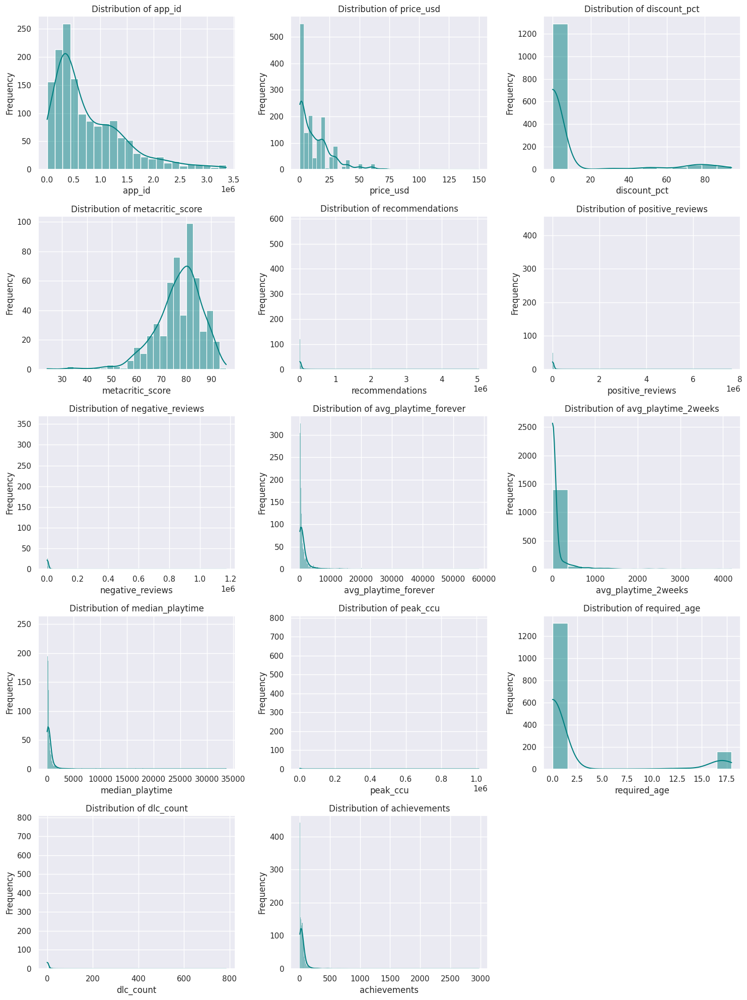

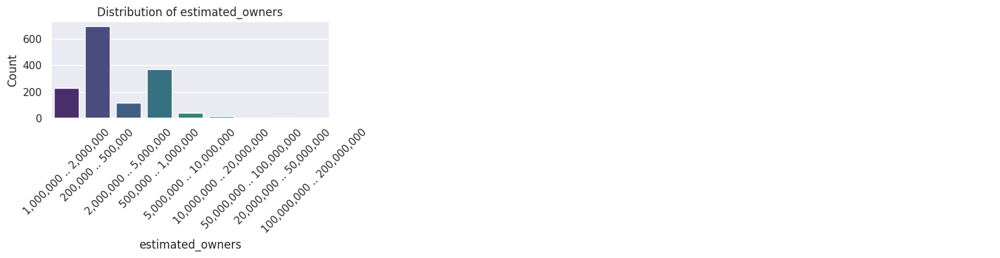

--- Categorical Value Counts ---

Value counts for estimated_owners:
estimated_owners
200,000 .. 500,000            695
500,000 .. 1,000,000          373
1,000,000 .. 2,000,000        231
2,000,000 .. 5,000,000        119
5,000,000 .. 10,000,000        42
10,000,000 .. 20,000,000       19
20,000,000 .. 50,000,000        8
50,000,000 .. 100,000,000       2
100,000,000 .. 200,000,000      1
Name: count, dtype: int64


In [12]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# BIvariate Analysis

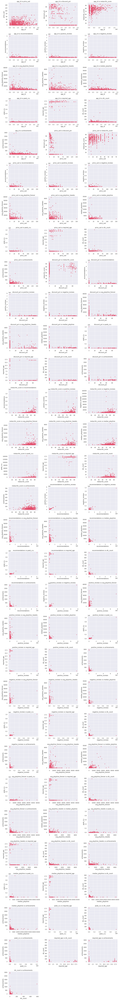

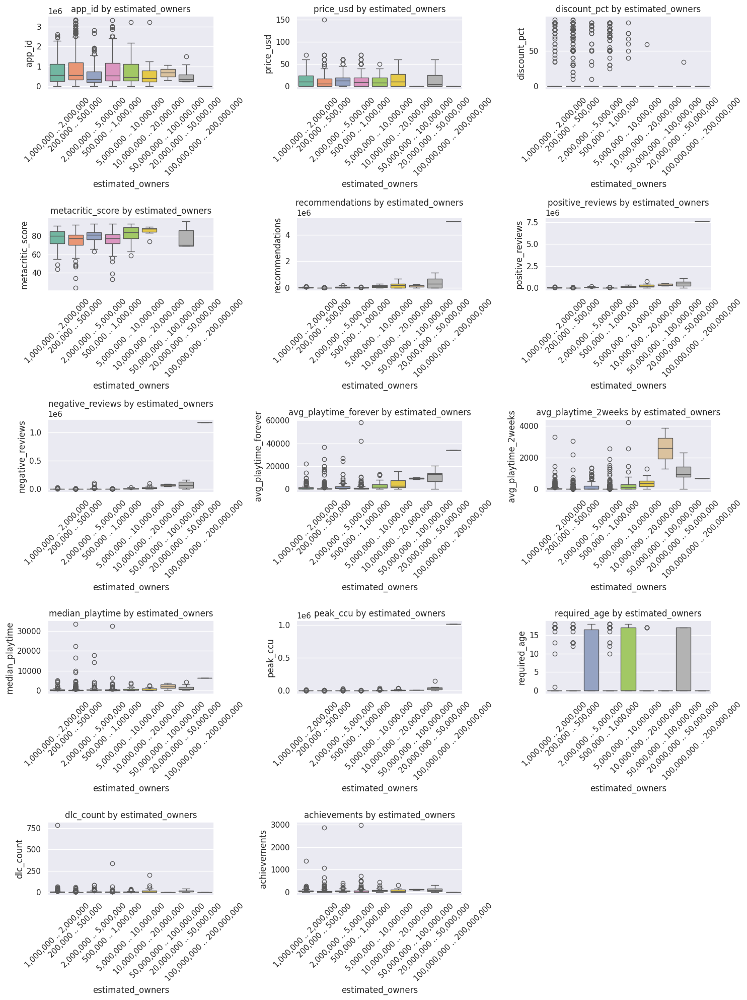

In [13]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Multivariate Analysis


Analyzing relationships with Hue: estimated_owners...


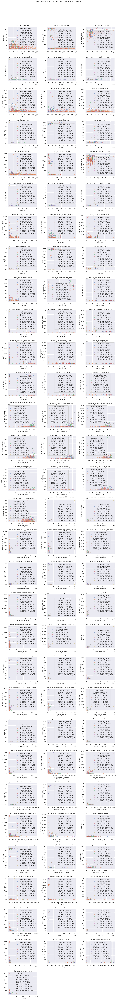

In [14]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pairplot

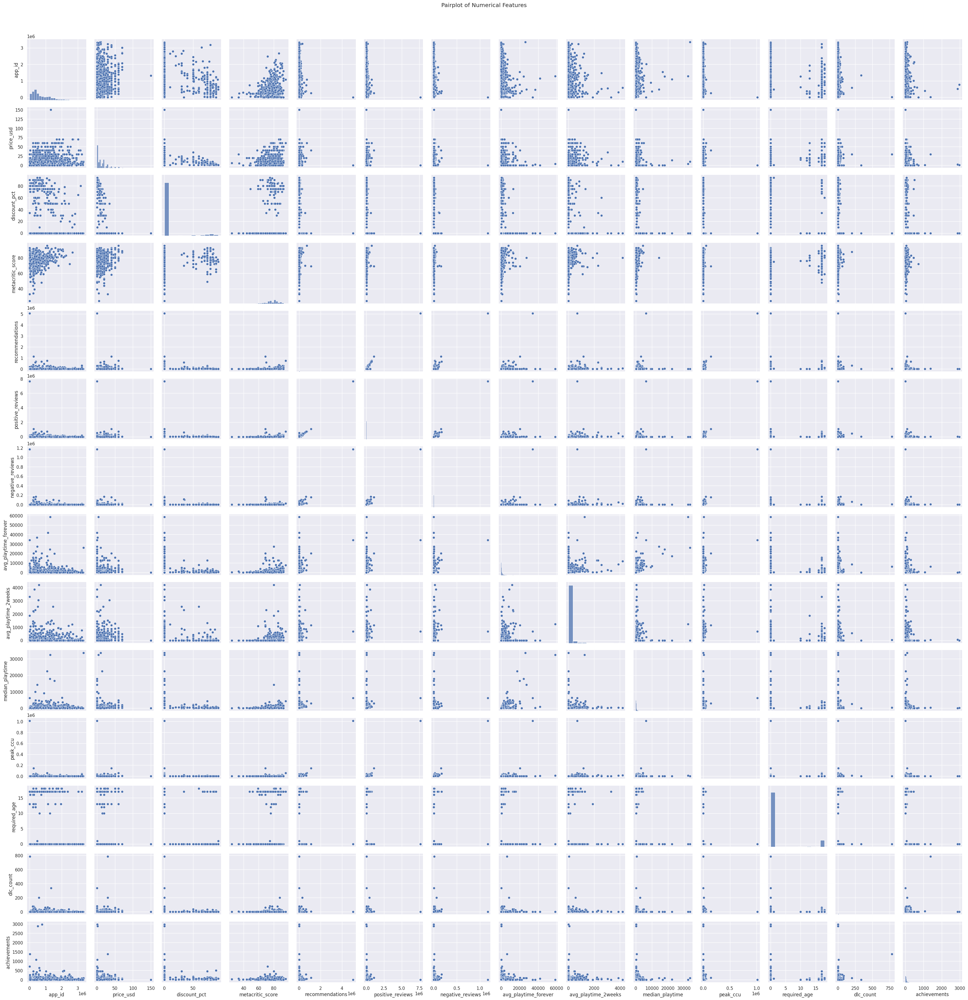

In [16]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

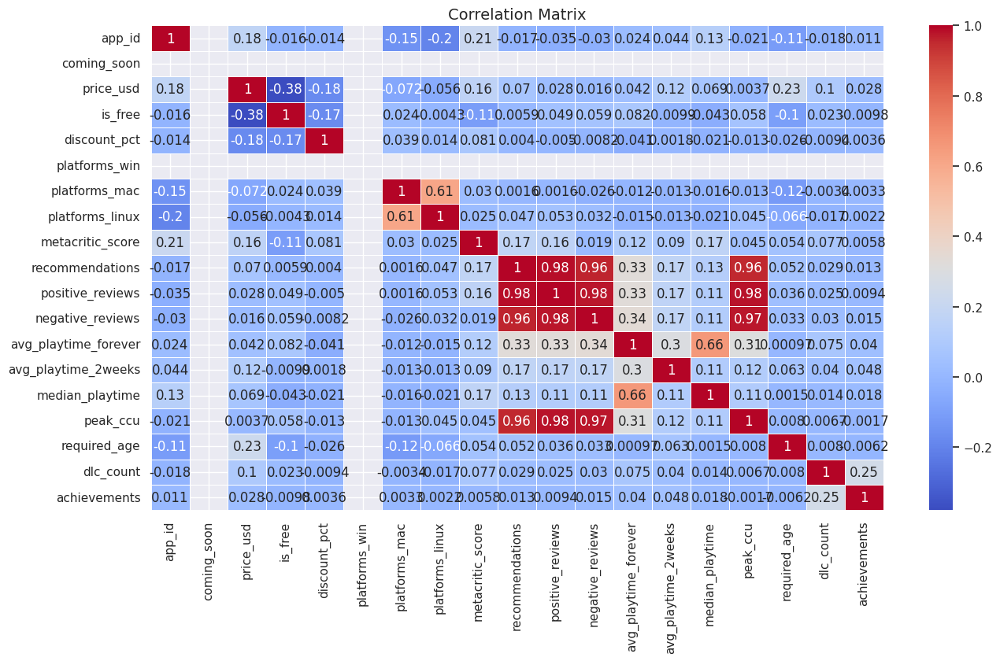

In [17]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

## Gaming Diagnostics & Statistical Testing

--- 1. ENGINEERING PLAYER ENGAGEMENT METRICS ---
Engineered: 'total_reviews' and 'sentiment_ratio' to quantify community reception.

--- 2. THE FREE-TO-PLAY PARADOX (MANN-WHITNEY U TEST) ---
Mann-Whitney P-Value (F2P vs Paid Peak CCU): 1.1781e-01
Insight: The monetization model (Free vs Paid) does not mathematically impact median peak player counts.


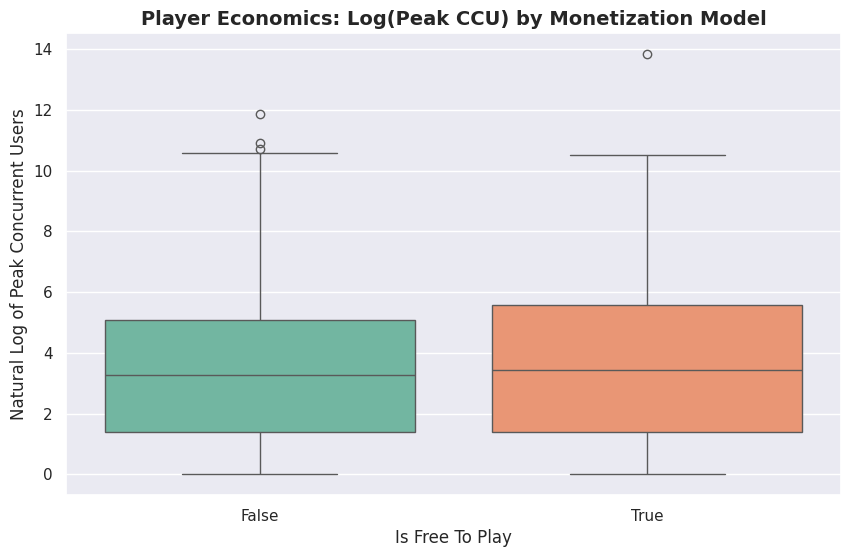


--- 3. PRICING ELASTICITY & SENTIMENT (SPEARMAN RANK CORRELATION) ---
Spearman Correlation Coefficient (Price vs. Sentiment): 0.2103
P-Value: 6.4427e-14
Insight: Positive correlation detected. Expensive games are rated better, likely indicating higher AAA quality.


In [15]:
import scipy.stats as stats


print("--- 1. ENGINEERING PLAYER ENGAGEMENT METRICS ---")
df_clean = df.dropna(subset=['price_usd', 'is_free', 'positive_reviews', 'negative_reviews', 'peak_ccu', 'avg_playtime_forever']).copy()

# 1. Total Reviews
df_clean['total_reviews'] = df_clean['positive_reviews'] + df_clean['negative_reviews']

# 2. Review Sentiment Ratio (Percentage of reviews that are positive)
df_clean['sentiment_ratio'] = df_clean['positive_reviews'] / df_clean['total_reviews'].replace(0, 1)

# Ensure 'is_free' is treated as a binary/boolean variable
df_clean['is_free'] = df_clean['is_free'].astype(bool)

print("Engineered: 'total_reviews' and 'sentiment_ratio' to quantify community reception.")


print("\n--- 2. THE FREE-TO-PLAY PARADOX (MANN-WHITNEY U TEST) ---")
# Do Free-to-Play games generate mathematically higher Peak CCU than Paid games?
# We use Mann-Whitney U because player counts are heavily right-skewed (power law distribution).

f2p_ccu = df_clean[df_clean['is_free'] == True]['peak_ccu']
paid_ccu = df_clean[df_clean['is_free'] == False]['peak_ccu']

if len(f2p_ccu) > 1 and len(paid_ccu) > 1:
    u_stat, p_val_mw = stats.mannwhitneyu(f2p_ccu, paid_ccu, alternative='two-sided')

    print(f"Mann-Whitney P-Value (F2P vs Paid Peak CCU): {p_val_mw:.4e}")
    if p_val_mw < 0.05:
        if f2p_ccu.median() > paid_ccu.median():
            print("Insight: Free-to-Play games possess a mathematically distinct and higher baseline of Peak CCU.")
        else:
            print("Insight: Paid games possess a distinct and higher baseline of Peak CCU.")
    else:
        print("Insight: The monetization model (Free vs Paid) does not mathematically impact median peak player counts.")

# Visualizing the Player Economics
plt.figure(figsize=(10, 6))
# Using log scale for CCU due to extreme outliers like CS:GO or Dota 2
sns.boxplot(x='is_free', y=np.log1p(df_clean['peak_ccu']), data=df_clean, palette='Set2')
plt.title('Player Economics: Log(Peak CCU) by Monetization Model', fontsize=14, fontweight='bold')
plt.xlabel('Is Free To Play')
plt.ylabel('Natural Log of Peak Concurrent Users')
plt.show()


print("\n--- 3. PRICING ELASTICITY & SENTIMENT (SPEARMAN RANK CORRELATION) ---")
# Does a higher price mathematically guarantee a lower sentiment ratio (harsher reviews)?
# We focus only on Paid games for this test.

paid_games = df_clean[df_clean['is_free'] == False]

spearman_coef, p_val_spearman = stats.spearmanr(paid_games['price_usd'], paid_games['sentiment_ratio'])

print(f"Spearman Correlation Coefficient (Price vs. Sentiment): {spearman_coef:.4f}")
print(f"P-Value: {p_val_spearman:.4e}")

if p_val_spearman < 0.05:
    if spearman_coef < 0:
        print("Insight: Negative correlation detected. Pricing elasticity exists in reviews.")
        print("   -> As the price increases, player expectations rise, resulting in statistically harsher review sentiments.")
    else:
        print("Insight: Positive correlation detected. Expensive games are rated better, likely indicating higher AAA quality.")
else:
    print("Insight: Null Hypothesis accepted. A game's price has no mathematical relationship with how positively it is reviewed.")

## Advanced Gaming Econometrics

In [18]:
import statsmodels.api as sm

print("--- 1. SUCCESS ATTRIBUTION (MULTIVARIATE OLS REGRESSION) ---")
# Holding price and total reviews constant, does Metacritic Score
# or DLC count actually drive peak concurrent players?

# We will apply a log transformation to Peak CCU to normalize the extreme right skew.
ols_df = df_clean.dropna(subset=['peak_ccu', 'metacritic_score', 'price_usd', 'total_reviews', 'dlc_count']).copy()

# Define Target (Y) and Independent Features (X)
Y_ols = np.log1p(ols_df['peak_ccu'])
X_ols = sm.add_constant(ols_df[['metacritic_score', 'price_usd', 'total_reviews', 'dlc_count']])

# Fitting the Multivariate OLS Model
game_model = sm.OLS(Y_ols, X_ols).fit()

print("\nMULTIVARIATE SUCCESS ATTRIBUTION RESULTS:")
significant_drivers = game_model.pvalues[game_model.pvalues < 0.05]

if len(significant_drivers) > 1:
    print("Controlling for overlapping market factors, the following variables significantly drive Log(Peak CCU):")
    for feature in significant_drivers.index:
        if feature != 'const':
            impact = game_model.params[feature]
            direction = "INCREASES" if impact > 0 else "DECREASES"
            print(f"   -> {feature}: A 1-unit shift {direction} the Log(Peak CCU) by {abs(impact):.4f}.")
else:
    print("No statistically significant continuous drivers found for Peak CCU within these parameters.")

--- 1. SUCCESS ATTRIBUTION (MULTIVARIATE OLS REGRESSION) ---

MULTIVARIATE SUCCESS ATTRIBUTION RESULTS:
Controlling for overlapping market factors, the following variables significantly drive Log(Peak CCU):
   -> metacritic_score: A 1-unit shift INCREASES the Log(Peak CCU) by 0.0674.
   -> price_usd: A 1-unit shift INCREASES the Log(Peak CCU) by 0.0428.
   -> total_reviews: A 1-unit shift INCREASES the Log(Peak CCU) by 0.0000.
   -> dlc_count: A 1-unit shift INCREASES the Log(Peak CCU) by 0.0153.


# Feature Engineering

In [19]:
# ==========================================
# PHASE 4: PREDICTIVE FEATURE ENGINEERING
# ==========================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

print("--- 1. TARGET ISOLATION & LEAKAGE PREVENTION ---")
# Re-calculate sentiment ratio just in case it was dropped in the previous step
df_clean['total_reviews'] = df_clean['positive_reviews'] + df_clean['negative_reviews']
df_clean['sentiment_ratio'] = df_clean['positive_reviews'] / df_clean['total_reviews'].replace(0, 1)

# We define "Highly Positive" as a game maintaining an 85% or higher positive review ratio.
# This represents a critical success in the Steam ecosystem.
df_clean['is_highly_positive'] = np.where(df_clean['sentiment_ratio'] >= 0.85, 1, 0)
y = df_clean['is_highly_positive']

# Drop columns that represent post-release telemetry to strictly prevent target leakage.
drop_cols = [
    'app_id', 'name', 'release_date', 'coming_soon', 'developer', 'publisher',
    'short_description', 'header_image', 'positive_reviews', 'negative_reviews',
    'total_reviews', 'sentiment_ratio', 'recommendations', 'estimated_owners',
    'peak_ccu', 'avg_playtime_forever', 'avg_playtime_2weeks', 'median_playtime',
    'metacritic_score', 'is_highly_positive'
]

ml_df = df_clean.drop(columns=[col for col in drop_cols if col in df_clean.columns], errors='ignore').copy()

print("Target Formulated: 'is_highly_positive' isolated.")
print("Target Leakage Prevented: All post-release player counts and review metrics removed.")


print("\n--- 2. LATENT SEMANTIC ANALYSIS (NLP ON GAME TAGS) ---")
# Game 'tags' (e.g., "Multiplayer", "Souls-like", "Cyberpunk") contain massive predictive power.
# We will vectorize these text strings using TF-IDF and compress them into 10 dense mathematical themes using SVD.

# Replace null tags with empty strings
ml_df['tags'] = ml_df['tags'].fillna('')

# Initialize TF-IDF Vectorizer
tfidf = TfidfVectorizer(stop_words='english', max_features=500)
tfidf_matrix = tfidf.fit_transform(ml_df['tags'])

# Compress the sparse matrix into 10 Latent Semantic themes
svd = TruncatedSVD(n_components=10, random_state=42)
lsa_features = svd.fit_transform(tfidf_matrix)

# Append the NLP vectors to our feature dataframe
for i in range(10):
    ml_df[f'Tag_Semantic_Vector_{i+1}'] = lsa_features[:, i]

# Drop the raw text columns
ml_df = ml_df.drop(columns=['genres', 'categories', 'tags'], errors='ignore')

print("Engineered: Text tags compressed into 10 non-linear Latent Semantic vectors.")


print("\n--- 3. ONE-HOT VECTORIZATION & STANDARDIZATION ---")
# Convert categorical booleans into standard floats
ml_df['is_free'] = ml_df['is_free'].astype(float)
ml_df['platforms_win'] = ml_df['platforms_win'].astype(float)
ml_df['platforms_mac'] = ml_df['platforms_mac'].astype(float)
ml_df['platforms_linux'] = ml_df['platforms_linux'].astype(float)

# Standardize numerical pricing and structural metrics
continuous_features = ['price_usd', 'discount_pct', 'dlc_count', 'achievements', 'required_age']
scaler = StandardScaler()
ml_df[continuous_features] = scaler.fit_transform(ml_df[continuous_features])

# Define the final Feature Matrix (X)
X_adv = ml_df.copy()

print(f"Final Machine-Readable Matrix Assembled: {X_adv.shape[1]} predictive dimensions ready for ML.")

--- 1. TARGET ISOLATION & LEAKAGE PREVENTION ---
Target Formulated: 'is_highly_positive' isolated.
Target Leakage Prevented: All post-release player counts and review metrics removed.

--- 2. LATENT SEMANTIC ANALYSIS (NLP ON GAME TAGS) ---
Engineered: Text tags compressed into 10 non-linear Latent Semantic vectors.

--- 3. ONE-HOT VECTORIZATION & STANDARDIZATION ---
Final Machine-Readable Matrix Assembled: 19 predictive dimensions ready for ML.


# The Game Success Classification Engine (ML)

--- 1. OUT-OF-SAMPLE DATA SPLITTING ---
Training Set: 1196 games
Testing Set: 299 games (Strictly Unseen)

--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---
Both Classification Architectures successfully trained.

--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---

[Random Forest Performance Metrics]
   -> Precision: 67.10% (When predicting a Smash Hit, how often is it correct?)
   -> Recall:    70.75% (Capture rate of actual Smash Hits)
   -> F1-Score:  68.87% (Harmonic mean of Precision and Recall)
----------------------------------------

[XGBoost Performance Metrics]
   -> Precision: 65.56% (When predicting a Smash Hit, how often is it correct?)
   -> Recall:    67.35% (Capture rate of actual Smash Hits)
   -> F1-Score:  66.44% (Harmonic mean of Precision and Recall)

The Random Forest mathematically outperformed the alternative in predicting gaming success.

--- 4. VISUALIZING ALGORITHMIC ACCURACY (CONFUSION MATRIX) ---


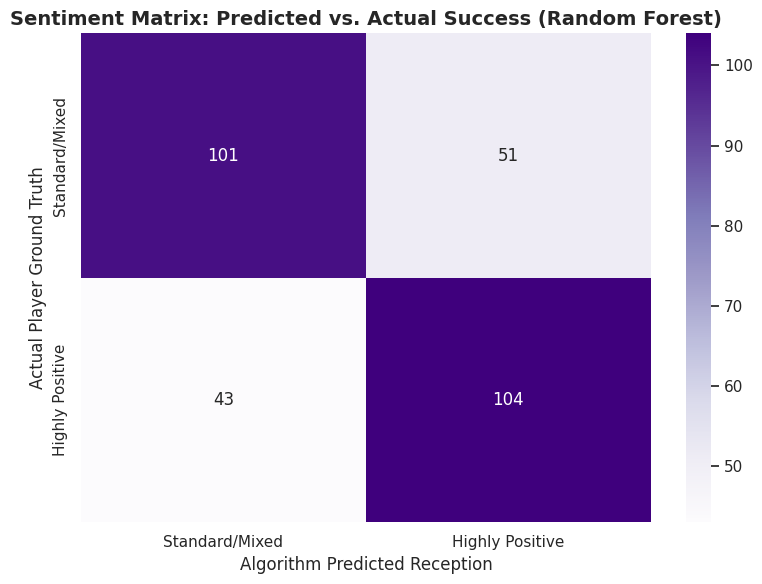


--- 5. ALGORITHMIC FEATURE IMPORTANCE ---


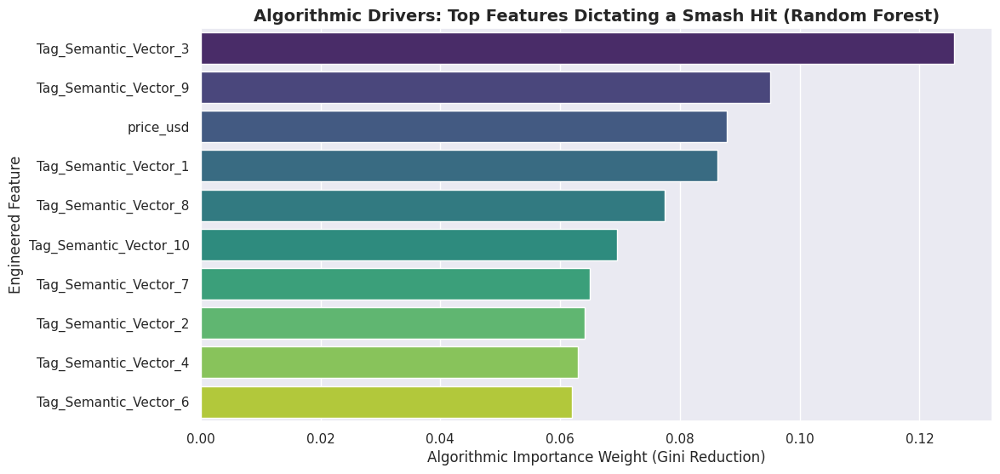

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

print("--- 1. OUT-OF-SAMPLE DATA SPLITTING ---")
# Spliting: 80% to train the algorithmic rules of gaming success,
# 20% to test true predictive power on unseen titles.

X_train, X_test, y_train, y_test = train_test_split(X_adv, y, test_size=0.2, random_state=42, stratify=y)

print(f"Training Set: {len(X_train)} games")
print(f"Testing Set: {len(X_test)} games (Strictly Unseen)")


print("\n--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---")

# 1. Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=200, max_depth=8, class_weight='balanced', random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# 2. XGBoost Classifier
scale_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1]) if len(y_train[y_train == 1]) > 0 else 1
xgb_model = XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.05, scale_pos_weight=scale_weight, random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)

print("Both Classification Architectures successfully trained.")

print("\n--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---")
rf_preds = rf_model.predict(X_test)
xgb_preds = xgb_model.predict(X_test)

def evaluate_classifier(name, y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"\n[{name} Performance Metrics]")
    print(f" -> Precision: {prec * 100:.2f}% (When predicting a Smash Hit, how often is it correct?)")
    print(f" -> Recall:    {rec * 100:.2f}% (Capture rate of actual Smash Hits)")
    print(f" -> F1-Score:  {f1 * 100:.2f}% (Harmonic mean of Precision and Recall)")
    return f1

f1_rf = evaluate_classifier("Random Forest", y_test, rf_preds)
print("-" * 40)
f1_xgb = evaluate_classifier("XGBoost", y_test, xgb_preds)

best_model_name = "XGBoost" if f1_xgb > f1_rf else "Random Forest"
best_preds = xgb_preds if f1_xgb > f1_rf else rf_preds
best_model = xgb_model if f1_xgb > f1_rf else rf_model

print(f"\nThe {best_model_name} mathematically outperformed the alternative in predicting gaming success.")


print("\n--- 4. VISUALIZING ALGORITHMIC ACCURACY (CONFUSION MATRIX) ---")
cm = confusion_matrix(y_test, best_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Standard/Mixed', 'Highly Positive'],
            yticklabels=['Standard/Mixed', 'Highly Positive'])
plt.title(f'Sentiment Matrix: Predicted vs. Actual Success ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Algorithm Predicted Reception', fontsize=12)
plt.ylabel('Actual Player Ground Truth', fontsize=12)
plt.tight_layout()
plt.show()


print("\n--- 5. ALGORITHMIC FEATURE IMPORTANCE ---")
importances = pd.Series(best_model.feature_importances_, index=X_adv.columns).sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title(f'Algorithmic Drivers: Top Features Dictating a Smash Hit ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Algorithmic Importance Weight (Gini Reduction)', fontsize=12)
plt.ylabel('Engineered Feature', fontsize=12)
plt.show()

# Thank You